In [1]:
import librosa
import matplotlib.pyplot as plt
import numpy as np
import librosa.display
#from pydub import AudioSegment

testing pyin

In [2]:
y, sr = librosa.load(librosa.ex('trumpet'))
f0, voiced_flag, voiced_probs = librosa.pyin(y, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))
times = librosa.times_like(f0)

In [3]:
sr

22050

In [4]:
len(y)

117601

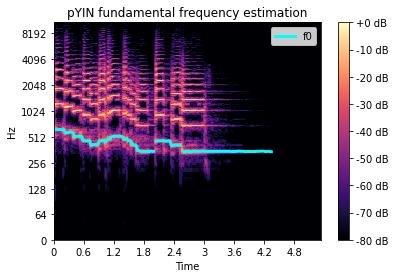

In [5]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
fig, ax = plt.subplots()
img = librosa.display.specshow(D, x_axis='time', y_axis='log', ax=ax)
ax.set(title='pYIN fundamental frequency estimation')
fig.colorbar(img, ax=ax, format="%+2.f dB")
ax.plot(times, f0, label='f0', color='cyan', linewidth=3)
ax.legend(loc='upper right')

load our own

In [40]:
# 1. Get the file path to an included audio example
filename = '14-144.mp3'

# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(filename)

/Users/kathleenyoung/opt/anaconda3/envs/capstone/lib/python3.9/site-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [41]:
y

array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)

In [42]:
sr

22050

In [43]:
len(y)

78867648

In [44]:
# check that sample rate works the way I think it does
sr * (59 * 60 + 37)

78872850

okay so I mean to look at just the first five minutes I guess you'l look at the first however many entries of the y array

trying pydub

In [45]:
#aud = AudioSegment.from_mp3('14-144.mp3')
#five_mins = 1000 * 60 * 5
#first_5_mins = aud[:five_mins]

nevermind

let's try it in librosa

In [54]:
five_mins = sr * 60 * 5
first_5_mins = y[:five_mins]

In [55]:
first_5_mins

array([0.        , 0.        , 0.        , ..., 0.01989746, 0.02163696,
       0.02676392], dtype=float32)

In [56]:
len(first_5_mins)

6615000

In [57]:
len(first_5_mins)/len(y)

0.08387469599702023

cool it looks right

"The fundamental frequency, often referred to simply as the fundamental, is defined as the lowest frequency of a periodic waveform. In music, the fundamental is the musical pitch of a note that is perceived as the lowest partial present."

so it's just pyin...which I guess is why we need it specifically duh

In [58]:
f0, voiced_flag, voiced_probs = librosa.pyin(first_5_mins, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))
times = librosa.times_like(f0)

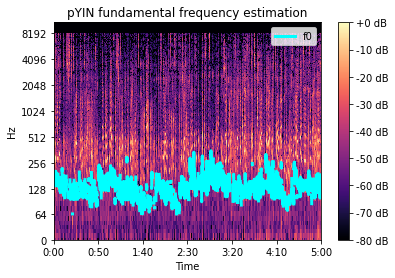

In [59]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(first_5_mins)), ref=np.max)
fig, ax = plt.subplots()
img = librosa.display.specshow(D, x_axis='time', y_axis='log', ax=ax)
ax.set(title='pYIN fundamental frequency estimation')
fig.colorbar(img, ax=ax, format="%+2.f dB")
ax.plot(times, f0, label='f0', color='cyan', linewidth=3)
ax.legend(loc='upper right')

play it?

In [31]:
import IPython
IPython.display.Audio("14-144.mp3")

In [32]:
librosa.ex('trumpet')
#IPython.display.Audio(librosa.ex('trumpet'))